#Dependencies

In [ ]:
!pip install datamapplot

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.9/150.9 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 111.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 64.1 MB/s eta 0:00:00
  Created wheel for Pyqtree: filename=Pyqtree-1.0.0-py3-none-any.whl size=5969 sha256=d03fde1716447b6a831408a9c7ea9872f399a0032ef9bbbf037eb2686cf67158
  Stored in directory: /root/.cache/pip/wheels/4c/87/93/c44242a244e4cea2cb9f5414ec450ababd7acac8b3377c3f9e
Successfully built Pyqtree


In [ ]:
!pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 116.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 80.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninst

#Importing Libraries

In [ ]:
import os
import re
import glob
import json
import zipfile
import random
import openai
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn import metrics
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from google.colab import files
from umap import UMAP
import umap
from hdbscan import HDBSCAN
import hdbscan
from bertopic import BERTopic
import bertopic
from bertopic.representation import OpenAI
import datamapplot
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration
import plotly.express as px
import plotly.io as pio

#Downloading Dataset from Kaggle

In [ ]:
!curl -L -o /content/arxiv.zip https://www.kaggle.com/api/v1/datasets/download/Cornell-University/arxiv

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 1470M  100 1470M    0     0  21.3M      0  0:01:08  0:01:08 --:--:-- 22.9M


In [ ]:
!unzip "/content/arxiv.zip"

Archive:  /content/arxiv.zip
  inflating: arxiv-metadata-oai-snapshot.json  


In [ ]:
!rm "/content/arxiv.zip"

In [ ]:
total_papers = 0
with open('/content/arxiv-metadata-oai-snapshot.json', 'r') as f:
    for _ in tqdm(f, desc="Counting papers"):
        total_papers += 1

Counting papers: 2730173it [00:03, 770194.45it/s]


In [ ]:
# Calculate random sample indices (100,000 papers)
sample_size = 100000
sample_indices = set(random.sample(range(total_papers), sample_size))


In [ ]:
chunks = []
chunk_size = 10000
paper_count = 0


In [ ]:

with open('/content/arxiv-metadata-oai-snapshot.json', 'r') as f:
    for i, line in enumerate(tqdm(f, total=total_papers)):
        if i in sample_indices:
            paper = json.loads(line)
            chunks.append({
                'id': paper['id'],
                'abstract': paper.get('abstract', ''),
                'categories': paper.get('categories', '').split(),
                'year': paper.get('update_date', '')[:4]
            })
            paper_count += 1

            if paper_count >= sample_size:
                break

        # Original chunk saving logic (modified for sample)
        if (i + 1) % chunk_size == 0 and chunks:
            pd.DataFrame(chunks).to_parquet(f'chunk_{i}.parquet')
            chunks = []
if chunks:
    pd.DataFrame(chunks).to_parquet(f'chunk_{i}_final.parquet')

100%|█████████▉| 2730121/2730173 [00:06<00:00, 426118.49it/s]


In [ ]:
# Merge chunks (if multiple were created)
df = pd.concat([pd.read_parquet(f) for f in glob.glob('chunk_*.parquet')])

In [ ]:
df.head()

,id,abstract,categories,year
0,1412.2041,Stein showed that the multivariate sample me...,"[stat.ME, stat.ML]",2014
1,1412.2086,Long slit spectra recorded with GMOS on Gemi...,[astro-ph.GA],2015
2,1412.2115,"In recent years, crowdfunding has become a p...","[cs.CY, astro-ph.IM, physics.ed-ph, physics.so...",2014
3,1412.2122,In this paper we present a non-invasive ambi...,"[cs.HC, cs.AI, cs.CY]",2016
4,1412.2158,We propose a two-layer mobile sink and stati...,[cs.NI],2014


In [ ]:
df.columns

Index(['id', 'abstract', 'categories', 'year'], dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100000 entries, 0 to 370
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   id          100000 non-null  object
 1   abstract    100000 non-null  object
 2   categories  100000 non-null  object
 3   year        100000 non-null  object
dtypes: object(4)
memory usage: 5.8+ MB


In [ ]:
df['categories']

,categories
0,"[stat.ME, stat.ML]"
1,[astro-ph.GA]
2,"[cs.CY, astro-ph.IM, physics.ed-ph, physics.so..."
3,"[cs.HC, cs.AI, cs.CY]"
4,[cs.NI]
...,...
366,[cs.RO]
367,"[astro-ph.SR, astro-ph.GA, astro-ph.IM]"
368,[math.PR]
369,"[physics.app-ph, cs.ET]"


# Data Preparation

In [ ]:
def extract_id(paper_id):
    # For old format: strip subject prefix
    if '/' in paper_id:
        return paper_id.split('/')[-1]
    # For new/modern: keep as-is
    return paper_id

df['id'] = df['id'].apply(extract_id)

In [ ]:
df

,id,abstract,categories,year
0,1412.2046,We present a tensorial relative of the famil...,[gr-qc],2014
1,1412.2049,Assuming the dominance of the spin-spin inte...,[hep-ph],2015
2,1412.2060,This is a brief look at how Einstein explore...,[physics.hist-ph],2014
3,1412.2093,We present an approach to approximating rapi...,[astro-ph.GA],2015
4,1412.2095,"In this paper, the notion of $c$-support poi...",[math.FA],2019
...,...,...,...,...
397,2403.02820,"In the wood industry, logs are commonly qual...",[cs.AI],2024
398,2403.02822,With remarkable electrical and optical switc...,"[physics.app-ph, cs.ET]",2024
399,2403.02838,The detection of extracellular pH at single ...,[physics.bio-ph],2024
400,2403.02840,A theory of martingales for censoring is dev...,"[math.ST, stat.ME, stat.TH]",2024


#Abstract Cleaning

In [ ]:
def clean_abstract(text):
    """
    Clean abstracts for embedding/clustering:
    1. Lowercase
    2. Replace LaTeX symbols (e.g., \ell_0 → L0, \alpha_1 → alpha1)
    3. Remove LaTeX equations (e.g., \frac{1}{2})
    4. Remove URLs, arXiv IDs, emails
    5. Keep letters, numbers, basic punctuation
    6. Remove extra whitespace
    """
    if not isinstance(text, str):
        return ""

    # Lowercase
    text = text.lower()

    # Step 1: Replace LaTeX symbols with subscripts (e.g., \ell_0 → L0)
    latex_symbols = {
        r'\\ell': 'L',       # \ell → L
        r'\\alpha': 'alpha',
        r'\\beta': 'beta',
        r'\\gamma': 'gamma',
        r'\\theta': 'theta',
        r'\\lambda': 'lambda',
        r'\\sigma': 'sigma',
        r'\\mu': 'mu',
        r'\\epsilon': 'epsilon'
    }

    # Handle subscripts (e.g., \ell_0 → L0, \alpha_{1} → alpha1)
    for pattern, replacement in latex_symbols.items():
        # Case 1: \symbol_{number} → symbolnumber (e.g., \alpha_{1} → alpha1)
        text = re.sub(pattern + r'_\{(\d+)\}', replacement + r'\1', text)
        # Case 2: \symbol_number → symbolnumber (e.g., \alpha_1 → alpha1)
        text = re.sub(pattern + r'_(\d+)', replacement + r'\1', text)
        # Case 3: Standalone symbols (e.g., \alpha → alpha)
        text = re.sub(pattern, replacement, text)

    # Step 2: Remove remaining LaTeX commands (e.g., \frac{1}{2})
    text = re.sub(r'\\[a-zA-Z]+\{.*?\}', ' ', text)

    # Step 3: Remove URLs, arXiv IDs, emails
    text = re.sub(r'http\S+|www\S+|arxiv:\d+\.\d+|@\S+', ' ', text)

    # Step 4: Keep letters, numbers, and basic punctuation
    text = re.sub(r'[^a-zA-Z0-9\s.,;:!?\'"-]', ' ', text)

    # Step 5: Collapse whitespace and trim
    text = re.sub(r'\s+', ' ', text).strip()

    return text

In [ ]:
tqdm.pandas(desc="Cleaning abstracts")
df['cleaned_abstract'] = df['abstract'].progress_apply(clean_abstract)

Cleaning abstracts: 100%|██████████| 100000/100000 [00:11<00:00, 8501.63it/s]


In [ ]:
df

,id,abstract,categories,year,cleaned_abstract
0,1412.2046,We present a tensorial relative of the famil...,[gr-qc],2014,we present a tensorial relative of the familia...
1,1412.2049,Assuming the dominance of the spin-spin inte...,[hep-ph],2015,assuming the dominance of the spin-spin intera...
2,1412.2060,This is a brief look at how Einstein explore...,[physics.hist-ph],2014,this is a brief look at how einstein explored ...
3,1412.2093,We present an approach to approximating rapi...,[astro-ph.GA],2015,we present an approach to approximating rapidl...
4,1412.2095,"In this paper, the notion of $c$-support poi...",[math.FA],2019,"in this paper, the notion of c -support points..."
...,...,...,...,...,...
397,2403.02820,"In the wood industry, logs are commonly qual...",[cs.AI],2024,"in the wood industry, logs are commonly qualit..."
398,2403.02822,With remarkable electrical and optical switc...,"[physics.app-ph, cs.ET]",2024,with remarkable electrical and optical switchi...
399,2403.02838,The detection of extracellular pH at single ...,[physics.bio-ph],2024,the detection of extracellular ph at single ce...
400,2403.02840,A theory of martingales for censoring is dev...,"[math.ST, stat.ME, stat.TH]",2024,a theory of martingales for censoring is devel...


In [ ]:
# Assuming df['categories'] contains lists of strings
unique_categories = set(cat for row in df['categories'] for cat in row)

# Optional: convert to sorted list if needed
unique_categories = sorted(unique_categories)
print(unique_categories)

['acc-phys', 'adap-org', 'alg-geom', 'astro-ph', 'astro-ph.CO', 'astro-ph.EP', 'astro-ph.GA', 'astro-ph.HE', 'astro-ph.IM', 'astro-ph.SR', 'atom-ph', 'chao-dyn', 'chem-ph', 'cmp-lg', 'comp-gas', 'cond-mat', 'cond-mat.dis-nn', 'cond-mat.mes-hall', 'cond-mat.mtrl-sci', 'cond-mat.other', 'cond-mat.quant-gas', 'cond-mat.soft', 'cond-mat.stat-mech', 'cond-mat.str-el', 'cond-mat.supr-con', 'cs.AI', 'cs.AR', 'cs.CC', 'cs.CE', 'cs.CG', 'cs.CL', 'cs.CR', 'cs.CV', 'cs.CY', 'cs.DB', 'cs.DC', 'cs.DL', 'cs.DM', 'cs.DS', 'cs.ET', 'cs.FL', 'cs.GL', 'cs.GR', 'cs.GT', 'cs.HC', 'cs.IR', 'cs.IT', 'cs.LG', 'cs.LO', 'cs.MA', 'cs.MM', 'cs.MS', 'cs.NA', 'cs.NE', 'cs.NI', 'cs.OH', 'cs.OS', 'cs.PF', 'cs.PL', 'cs.RO', 'cs.SC', 'cs.SD', 'cs.SE', 'cs.SI', 'cs.SY', 'dg-ga', 'econ.EM', 'econ.GN', 'econ.TH', 'eess.AS', 'eess.IV', 'eess.SP', 'eess.SY', 'funct-an', 'gr-qc', 'hep-ex', 'hep-lat', 'hep-ph', 'hep-th', 'math-ph', 'math.AC', 'math.AG', 'math.AP', 'math.AT', 'math.CA', 'math.CO', 'math.CT', 'math.CV', 'math.

In [ ]:
total_unique = len(unique_categories)

print("Total unique categories:", total_unique)

Total unique categories: 174


In [ ]:
# Load your cleaned abstracts
documents = df['cleaned_abstract'].tolist()

In [ ]:
len(documents)

100000

In [ ]:
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(documents)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,34166,-1_to_and_on_this,"[to, and, on, this, for, of, we, in, is, that]",[self-driving vehicle vision systems must deal...
1,0,27773,0_mass_stars_galaxies_10,"[mass, stars, galaxies, 10, star, at, black, e...",[this paper is one in a series that explores t...
2,1,1163,1_graphs_graph_vertices_vertex,"[graphs, graph, vertices, vertex, edges, color...",[zero forcing in graphs is a coloring process ...
3,2,872,2_curvature_manifold_riemannian_manifolds,"[curvature, manifold, riemannian, manifolds, r...","[in this paper, we study certain compact 4-man..."
4,3,749,3_logic_semantics_automata_programs,"[logic, semantics, automata, programs, logics,...",[epistemic logic is known as a logic that capt...
...,...,...,...,...,...
585,584,10,584_security_cybersecurity_organizations_cyber,"[security, cybersecurity, organizations, cyber...",[security practices in large organizations are...
586,585,10,585_triangulations_gon_pentagulations_convex,"[triangulations, gon, pentagulations, convex, ...",[in this work we count the number of satisfyin...
587,586,10,586_extraction_relation_docre_persian,"[extraction, relation, docre, persian, biomedi...",[biomedical triple extraction systems aim to a...
588,587,10,587_granger_causality_cgcm_causal,"[granger, causality, cgcm, causal, tar4c, cgc,...",[important information on the structure of com...


In [ ]:
topic_model.get_topic(0)

[('mass', np.float64(0.0029503691204091067)),
 ('stars', np.float64(0.002504906512095493)),
 ('galaxies', np.float64(0.00248844080924405)),
 ('10', np.float64(0.0022241311862228265)),
 ('star', np.float64(0.0022176620004121543)),
 ('at', np.float64(0.0021703102406522385)),
 ('black', np.float64(0.0021095280470147014)),
 ('emission', np.float64(0.00207737219229214)),
 ('matter', np.float64(0.0020630537799440187)),
 ('stellar', np.float64(0.002034828230460936))]

In [ ]:
topic_model.get_document_info(documents)

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,we present a tensorial relative of the familia...,0,0_mass_stars_galaxies_10,"[mass, stars, galaxies, 10, star, at, black, e...",[this paper is one in a series that explores t...,mass - stars - galaxies - 10 - star - at - bla...,1.00000,False
1,assuming the dominance of the spin-spin intera...,0,0_mass_stars_galaxies_10,"[mass, stars, galaxies, 10, star, at, black, e...",[this paper is one in a series that explores t...,mass - stars - galaxies - 10 - star - at - bla...,1.00000,False
2,this is a brief look at how einstein explored ...,0,0_mass_stars_galaxies_10,"[mass, stars, galaxies, 10, star, at, black, e...",[this paper is one in a series that explores t...,mass - stars - galaxies - 10 - star - at - bla...,1.00000,False
3,we present an approach to approximating rapidl...,0,0_mass_stars_galaxies_10,"[mass, stars, galaxies, 10, star, at, black, e...",[this paper is one in a series that explores t...,mass - stars - galaxies - 10 - star - at - bla...,1.00000,False
4,"in this paper, the notion of c -support points...",-1,-1_to_and_on_this,"[to, and, on, this, for, of, we, in, is, that]",[self-driving vehicle vision systems must deal...,to - and - on - this - for - of - we - in - is...,0.00000,False
...,...,...,...,...,...,...,...,...
99995,"in the wood industry, logs are commonly qualit...",-1,-1_to_and_on_this,"[to, and, on, this, for, of, we, in, is, that]",[self-driving vehicle vision systems must deal...,to - and - on - this - for - of - we - in - is...,0.00000,False
99996,with remarkable electrical and optical switchi...,50,50_monolayer_exciton_excitons_dichalcogenides,"[monolayer, exciton, excitons, dichalcogenides...",[monolayer transition metal dichalcogenides tm...,monolayer - exciton - excitons - dichalcogenid...,0.67866,False
99997,the detection of extracellular ph at single ce...,-1,-1_to_and_on_this,"[to, and, on, this, for, of, we, in, is, that]",[self-driving vehicle vision systems must deal...,to - and - on - this - for - of - we - in - is...,0.00000,False
99998,a theory of martingales for censoring is devel...,-1,-1_to_and_on_this,"[to, and, on, this, for, of, we, in, is, that]",[self-driving vehicle vision systems must deal...,to - and - on - this - for - of - we - in - is...,0.00000,False


#Embedding Model Training from Hugging face

In [ ]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(documents, show_progress_bar=True)

Batches:   0%|          | 0/3406 [00:00<?, ?it/s]

###Saving Embedding model

In [ ]:
# Save the SentenceTransformer embedding model
output_path = "./my_embedding_model"
embedding_model.save(output_path)

In [ ]:
# Using zipfile to compress the folder first (recommended for larger folders)
folder_path = './my_embedding_model'  # Path to the folder you want to download
zip_path = './my_embedding_model.zip'  # Path where the zip file will be created

# Create a zip file containing the folder
def zipdir(path, ziph):
    # Iterate through all files in the directory
    for root, dirs, files in os.walk(path):
        for file in files:
            # Create the full file path
            file_path = os.path.join(root, file)
            # Add the file to the zip archive with a relative path
            ziph.write(file_path, os.path.relpath(file_path, os.path.join(path, '..')))

# Create the zip file
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipdir(folder_path, zipf)

# Download the zip file
from google.colab import files
files.download(zip_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Trying out UMAP

In [ ]:
#Reduced embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)

In [ ]:
df_plot = pd.DataFrame({
    "x1": [point[0] for point in reduced_embeddings],
    "x2": [point[1] for point in reduced_embeddings ],
    "documents": documents,
})

In [ ]:
df_plot.head()


,x1,x2,documents
0,6.512651,7.803227,this paper discusses the solvability global in...
1,3.475739,9.473783,quantum emitters qes coupled to structured bat...
2,8.967727,10.378108,we establish a formula for computing the unram...
3,8.044511,7.207810,"given a hypergraph , the -bootstrap process st..."
4,0.090880,1.137609,we present new high resolution imaging of a li...


In [ ]:
df_plot["docs_short"] = df_plot["documents"].str[:100] + "..."
df_plot.head(10)

,x1,x2,documents,docs_short
0,6.512651,7.803227,this paper discusses the solvability global in...,this paper discusses the solvability global in...
1,3.475739,9.473783,quantum emitters qes coupled to structured bat...,quantum emitters qes coupled to structured bat...
2,8.967727,10.378108,we establish a formula for computing the unram...,we establish a formula for computing the unram...
3,8.044511,7.207810,"given a hypergraph , the -bootstrap process st...","given a hypergraph , the -bootstrap process st..."
4,0.090880,1.137609,we present new high resolution imaging of a li...,we present new high resolution imaging of a li...
5,8.946667,5.941290,least squares method is one of the simplest an...,least squares method is one of the simplest an...
6,5.626369,7.592003,this article analyzes the formulation of space...,this article analyzes the formulation of space...
7,11.524076,1.574079,multilingual machine translation addresses the...,multilingual machine translation addresses the...
8,9.258984,4.945281,the problem of data clustering is one of the m...,the problem of data clustering is one of the m...
9,9.796972,9.795477,the subgroup lattice of a group is a great sou...,the subgroup lattice of a group is a great sou...


In [ ]:
pio.renderers.default = 'colab'

total_docs = len(df_plot)
fig = px.scatter(df_plot, x="x1", y="x2",  hover_data=["docs_short"])
fig.update_traces(marker=dict(line=dict(width=0.5, color='white')))
fig.update_layout(
    title=f"Arxiv Abstract - Document Map (2.7M documents)",
    title_font_size=20
)

fig.show()

###UMAP & HDBscan Model Initialization

In [ ]:
umap_model = UMAP(n_neighbors=30, n_components=10, min_dist=0.1, metric='cosine', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=100, min_samples=10, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

###GPT 4o mini Initialization

In [ ]:

prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short topic label in the following format:
topic: <topic label>
"""

# Create your representation model
client = openai.OpenAI(api_key="<PersonalOpenAIKey>")
representation_model = OpenAI(client, prompt=prompt, model="gpt-4o-mini", delay_in_seconds=30)



### Topic Representation Models

In [ ]:

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=0.3)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "MMR": mmr,
    "GPT-40": representation_model,
}

In [ ]:

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,
  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(documents, embeddings)

2025-05-15 23:19:39,836 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-15 23:22:43,728 - BERTopic - Dimensionality - Completed ✓
2025-05-15 23:22:43,734 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-15 23:22:52,329 - BERTopic - Cluster - Completed ✓
2025-05-15 23:22:52,350 - BERTopic - Representation - Fine-tuning topics using representation models.
100%|██████████| 122/122 [1:02:25<00:00, 30.70s/it]
2025-05-16 00:25:41,690 - BERTopic - Representation - Completed ✓


#Saving Bertopic Model

In [ ]:
topic_model.save("my_topic_model", serialization="safetensors", save_embedding_model=False)


2025-05-16 00:26:08,552 - BERTopic - WARNING: You are saving a BERTopic model without explicitly defining an embedding model.If you are using a sentence-transformers model or a HuggingFace model supportedby sentence-transformers, please save the model by using a pointer towards that model.For example, `save_embedding_model='sentence-transformers/all-mpnet-base-v2'`


In [ ]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,GPT-40,Representative_Docs
0,-1,53865,-1_the_of_and_in,"[the, of, and, in, to, we, is, for, that, with]","[models, model, quantum, dimensional, equation...","[the, of, and, we, for, from, model, two, time...",[Quantum Dynamics and Many-Body Localization A...,NaN
1,0,6818,0_image_to_learning_and,"[image, to, learning, and, our, methods, on, d...","[models, segmentation, model, supervised, data...","[learning, data, training, models, model, 3d, ...",[Advanced Methods in Image Recognition and 3D ...,NaN
2,1,5824,1_spin_magnetic_temperature_the,"[spin, magnetic, temperature, the, phase, in, ...","[superconductivity, superconductors, antiferro...","[magnetic, temperature, phase, graphene, elect...",[Superconductivity and Quantum Critical Phenom...,NaN
3,2,1437,2_robot_policy_learning_reinforcement,"[robot, policy, learning, reinforcement, rl, r...","[robots, robotic, robot, optimization, simulat...","[learning, reinforcement, rl, robots, planning...",[Reinforcement Learning and Policy Optimizatio...,NaN
4,3,1326,3_graphs_graph_vertices_vertex,"[graphs, graph, vertices, vertex, edge, number...","[graphs, subgraphs, graph, subgraph, vertices,...","[graphs, graph, vertices, edges, problem, mini...",[Graph Algorithms and Properties],NaN
...,...,...,...,...,...,...,...,...
117,116,107,116_protein_drug_molecular_molecules,"[protein, drug, molecular, molecules, proteins...","[research, proteins, peptides, modeling, ligan...","[drug, molecules, proteins, discovery, ligand,...",[Multimodal Approaches in Protein Research and...,NaN
118,117,104,117_anosov_hyperbolic_diffeomorphisms_entropy,"[anosov, hyperbolic, diffeomorphisms, entropy,...","[diffeomorphisms, diffeomorphism, ergodicity, ...","[diffeomorphisms, entropy, ergodic, lyapunov, ...",[Dynamics of Partially Hyperbolic Diffeomorphi...,NaN
119,118,102,118_cell_cells_gene_signaling,"[cell, cells, gene, signaling, biological, bio...","[phosphorylation, cells, biology, transcriptio...","[cells, signaling, metabolic, regulation, netw...",[Cell Signaling and Migration Dynamics in Biol...,NaN
120,119,101,119_hermitian_oscillator_hamiltonian_coherent,"[hermitian, oscillator, hamiltonian, coherent,...","[hermitian, hamiltonians, hamiltonian, eigenst...","[hermitian, oscillator, quantum, operators, ha...",[Non-Hermitian Hamiltonians and Quantum Invers...,NaN


#Model Visualization

In [ ]:
topic_model.visualize_topics()

In [ ]:
gpt4o_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["GPT-40"].values()]

In [ ]:
gpt4o_labels

['Quantum Dynamics and Many-Body Localization Analysis',
 'Advanced Methods in Image Recognition and 3D Modeling using Deep Learning',
 'Superconductivity and Quantum Critical Phenomena in Various Materials',
 'Reinforcement Learning and Policy Optimization in Robotics',
 'Graph Algorithms and Properties',
 'Energy-efficient Resource Allocation in Advanced Wireless Networks',
 'Advances in Medical Image Segmentation using Deep Learning Techniques',
 'Enhancements in Multilingual Language Models and Translation Techniques',
 'Cosmological Models and Dark Energy Dynamics in the Universe',
 'Dynamics of Fractional Branes and Holographic Dualities in String Theory',
 'Moduli Spaces and Semistable Bundles on Projective Curves and Surfaces',
 'Quantum Photonics and Light Manipulation',
 'Exoplanet Detection and Characteristics',
 'Homological Algebra and Representations in Functor Categories and Quantum Algebras',
 'Solar Magnetic Field and Its Effects on Solar Wind and Flares',
 'Higgs Boso

In [ ]:
# Get document info
document_info = topic_model.get_document_info(documents)
document_info["GPT-40"] = document_info["GPT-40"].apply(lambda x: x[0])

In [ ]:
all_labels = document_info["GPT-40"]

In [ ]:
all_labels.unique()

array(['Regularity and Existence of Solutions in Navier-Stokes and Euler Equations',
       'Quantum Dynamics and Many-Body Localization Analysis',
       'High-resolution observations of protoplanetary disks and molecular emissions in star-forming regions',
       'Stochastic and Bilevel Optimization Algorithms for Convex and Non-Convex Problems',
       'Dynamics of Interacting Particles in Exclusion Processes and Nonequilibrium Systems',
       'Enhancements in Multilingual Language Models and Translation Techniques',
       'Community Detection and Clustering in Dynamic Networks',
       'Group Theory and Automorphism Properties',
       'Chiral Phase Transition and Heavy Baryon/Meson Spectra in QCD with Two-Flavor Quarks',
       'Phase Transitions and Thermodynamics of Black Holes',
       'Superconductivity and Quantum Critical Phenomena in Various Materials',
       'Experimental Techniques and Models in Neural Network Dynamics and Activity',
       'Lattice QCD Simulations of 

In [ ]:
all_labels.nunique()

122

In [ ]:
topic_model.visualize_barchart()


In [ ]:
df_plot = pd.DataFrame({
    "x1": [point[0] for point in reduced_embeddings],
    "x2": [point[1] for point in reduced_embeddings],
    "docs": documents,
    "label": all_labels
})
df_plot["docs_short"] = df_plot["docs"].str[:100] + "..."
df_plot.head(10)

,x1,x2,docs,label,docs_short
0,6.512651,7.803227,this paper discusses the solvability global in...,Regularity and Existence of Solutions in Navie...,this paper discusses the solvability global in...
1,3.475739,9.473783,quantum emitters qes coupled to structured bat...,Quantum Dynamics and Many-Body Localization An...,quantum emitters qes coupled to structured bat...
2,8.967727,10.378108,we establish a formula for computing the unram...,Quantum Dynamics and Many-Body Localization An...,we establish a formula for computing the unram...
3,8.044511,7.207810,"given a hypergraph , the -bootstrap process st...",Quantum Dynamics and Many-Body Localization An...,"given a hypergraph , the -bootstrap process st..."
4,0.090880,1.137609,we present new high resolution imaging of a li...,High-resolution observations of protoplanetary...,we present new high resolution imaging of a li...
5,8.946667,5.941290,least squares method is one of the simplest an...,Stochastic and Bilevel Optimization Algorithms...,least squares method is one of the simplest an...
6,5.626369,7.592003,this article analyzes the formulation of space...,Dynamics of Interacting Particles in Exclusion...,this article analyzes the formulation of space...
7,11.524076,1.574079,multilingual machine translation addresses the...,Enhancements in Multilingual Language Models a...,multilingual machine translation addresses the...
8,9.258984,4.945281,the problem of data clustering is one of the m...,Community Detection and Clustering in Dynamic ...,the problem of data clustering is one of the m...
9,9.796972,9.795477,the subgroup lattice of a group is a great sou...,Group Theory and Automorphism Properties,the subgroup lattice of a group is a great sou...


In [ ]:
import plotly.express as px
fig = px.scatter(df_plot, x="x1", y="x2", color="label", hover_data=["docs_short"])
fig.show()

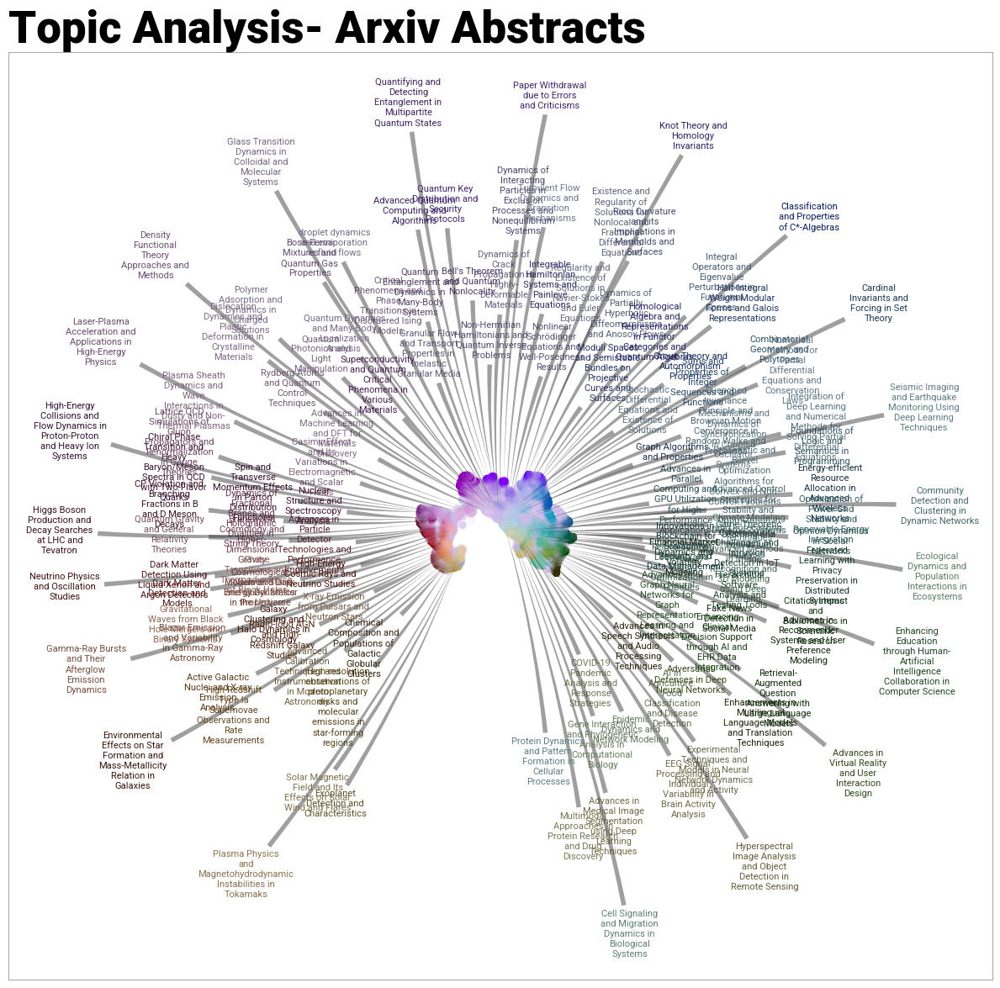

In [ ]:
# Run the visualization
datamapplot.create_plot(
    reduced_embeddings,
    all_labels,

    use_medoids=True,
    figsize=(12, 12),
    dpi=100,

    title="Topic Analysis- Arxiv Abstracts",
    sub_title_keywords={
        "fontsize":18,
    },

    highlight_labels=[
        "Retinopathy Prematurity Screening",
    ],
    highlight_label_keywords={
        "fontsize": 12,
        "fontweight": "bold",
        "bbox": {"boxstyle":"round"}
    },
    label_font_size=8,
    label_wrap_width=16,
    label_linespacing=1.25,
    label_direction_bias=1.3,
    label_margin_factor=2.0,
    label_base_radius=15.0,
    point_size=4,
    marker_type="o",
    arrowprops={
        "arrowstyle":"wedge,tail_width=0.5",
        "connectionstyle":"arc3,rad=0.05",
        "linewidth":0,
        "fc":"#33333377"
    },

    add_glow=True,
    glow_keywords={
        "kernel_bandwidth": 0.75,  # controls how wide the glow spreads.
        "kernel": "cosine",        # controls the kernel type. Default is "gaussian". See https://scikit-learn.org/stable/modules/density.html#kernel-density.
        "n_levels": 32,            # controls how many "levels" there are in the contour plot.
        "max_alpha": 0.9,          # controls the translucency of the glow.
    },

    darkmode=False,
)
plt.tight_layout()

# Save the plot as a png
plt.savefig('plot_datamapplot.png')


#Model Evaluation

In [ ]:
# Basic model information
topic_info = topic_model.get_topic_info()
print(f"Number of topics found: {len(topic_info[topic_info['Topic'] != -1])}")
print(f"Documents per topic (avg): {topic_info[topic_info['Topic'] != -1]['Count'].mean():.1f}")

# Topic diversity - check how unique the top words are across topics
all_top_words = []
unique_words = set()
for topic in topic_info[topic_info['Topic'] != -1]['Topic']:
    words = [word for word, _ in topic_model.get_topic(topic)]
    all_top_words.extend(words)
    unique_words.update(words)

diversity = len(unique_words) / len(all_top_words) if all_top_words else 0
print(f"Topic diversity score: {diversity:.4f} (higher is better)")

# Check if c_tf_idf is available and has the expected format
try:
    # Try to access the representation attribute directly
    coherence_values = []
    for topic in topic_info[topic_info['Topic'] != -1]['Topic']:
        # Get topic words with their scores
        topic_words = topic_model.get_topic(topic)
        if topic_words:
            # Calculate average score of top words as a simple coherence measure
            avg_score = sum(score for _, score in topic_words) / len(topic_words)
            coherence_values.append(avg_score)

    if coherence_values:
        avg_coherence = sum(coherence_values) / len(coherence_values)
        print(f"Average topic coherence (word scores): {avg_coherence:.4f}")
    else:
        print("Could not calculate coherence - no coherence values found")
except Exception as e:
    print(f"Could not calculate coherence: {str(e)}")

# Qualitative evaluation - print top topics
print("\nTop 5 largest topics:")
for idx, row in topic_info.sort_values("Count", ascending=False).head(5).iterrows():
    topic = row["Topic"]
    if topic != -1:  # Skip outlier topic
        words = ", ".join([word for word, _ in topic_model.get_topic(topic)])
        print(f"Topic {topic} (Count: {row['Count']}): {words}")

# Print topic distribution - how evenly documents are distributed
topic_counts = topic_info[topic_info['Topic'] != -1]['Count']
if len(topic_counts) > 0:
    min_count = topic_counts.min()
    max_count = topic_counts.max()
    print(f"Topic size distribution: min={min_count}, max={max_count}, ratio={min_count/max_count:.4f}")

Number of topics found: 121
Documents per topic (avg): 455.5
Topic diversity score: 0.7322 (higher is better)
Average topic coherence (word scores): 0.0195

Top 5 largest topics:
Topic 0 (Count: 6818): image, to, learning, and, our, methods, on, data, training, performance
Topic 1 (Count: 5824): spin, magnetic, temperature, the, phase, in, graphene, electron, of, electronic
Topic 2 (Count: 1437): robot, policy, learning, reinforcement, rl, robots, control, agent, tasks, planning
Topic 3 (Count: 1326): graphs, graph, vertices, vertex, edge, number, edges, every, if, coloring
Topic size distribution: min=100, max=53865, ratio=0.0019
